# Logistic Regression Implementation

In [30]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge,Lasso, RidgeCV, LassoCV, ElasticNet, ElasticNetCV, LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from pandas_profiling import ProfileReport
import pickle

In [5]:
df=pd.read_csv('diabetes.csv')
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [6]:
df.shape

(768, 9)

In [8]:
pf = ProfileReport(df)
pf

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Replacing the zero values in the dataset

In [9]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [16]:
df['BMI']=df['BMI'].replace(0, df['BMI'].mean())

In [17]:
df['BloodPressure']=df['BloodPressure'].replace(0, df['BloodPressure'].mean())

In [18]:
df['Insulin']=df['Insulin'].replace(0, df['Insulin'].mean())

In [19]:
df['Glucose']=df['Glucose'].replace(0, df['Glucose'].mean())

In [20]:
df['SkinThickness']=df['SkinThickness'].replace(0, df['SkinThickness'].mean())

In [26]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1


### Checking the outliers

<AxesSubplot:>

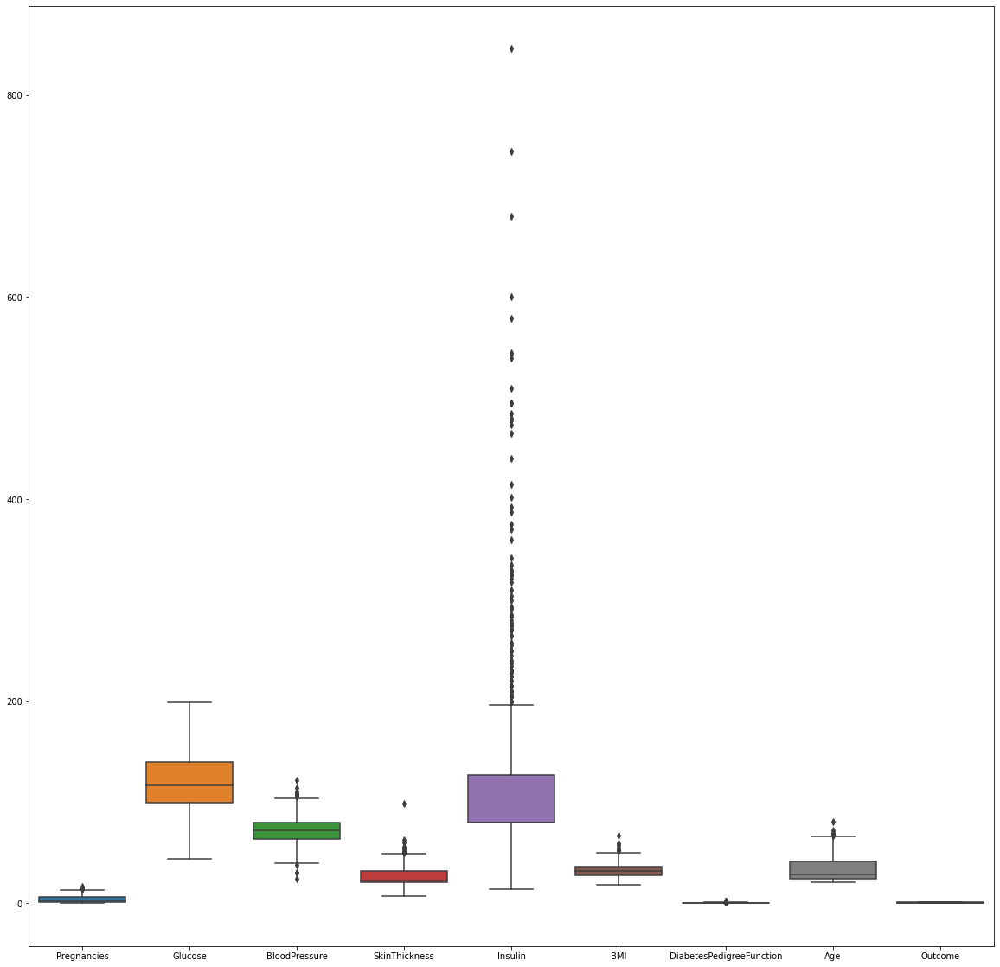

In [32]:
fig, ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=df)

There are some outliers in the features. So we remove the outliers

In [57]:
q = df['Pregnancies'].quantile(0.98)
df_new=df[df['Pregnancies']<q]

q = df_new['BMI'].quantile(0.99)
df_new=df_new[df_new['BMI']<q]

q = df_new['SkinThickness'].quantile(0.99)
df_new=df_new[df_new['SkinThickness']<q]

q = df_new['Insulin'].quantile(0.95)
df_new=df_new[df_new['Insulin']<q]

q = df_new['DiabetesPedigreeFunction'].quantile(0.99)
df_new=df_new[df_new['DiabetesPedigreeFunction']<q]

q = df_new['Age'].quantile(0.99)
df_new=df_new[df_new['Age']<q]

In [43]:
df_new

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


<AxesSubplot:>

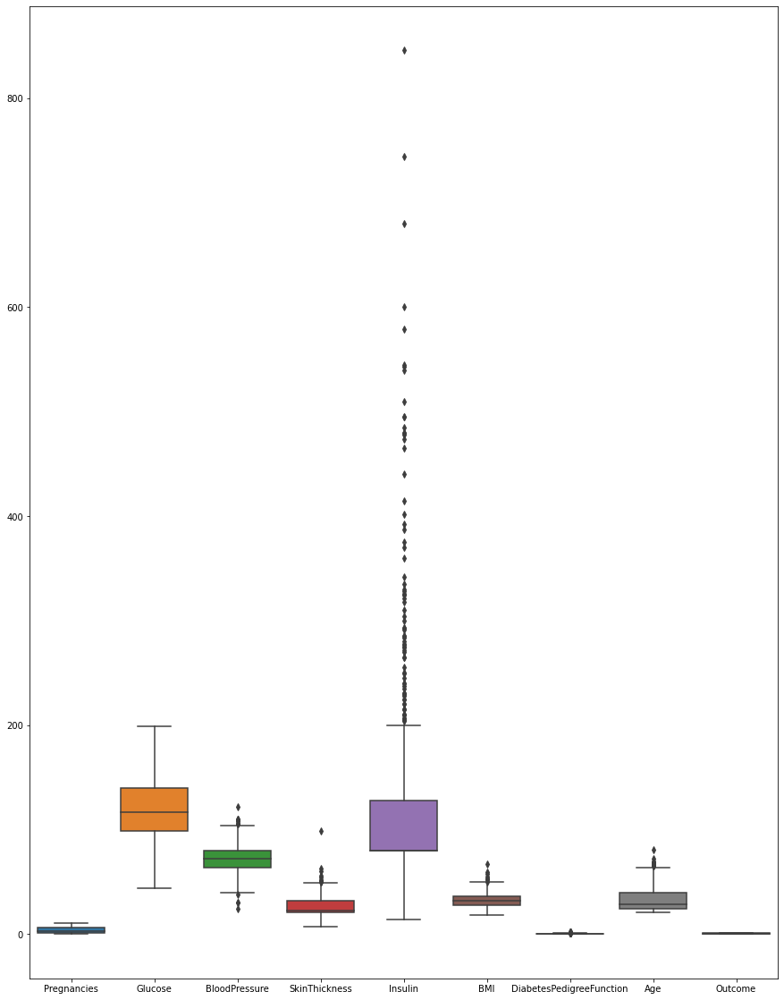

In [45]:
fig, ax = plt.subplots(figsize=(15,20))
sns.boxplot(data=df_new)

<AxesSubplot:>

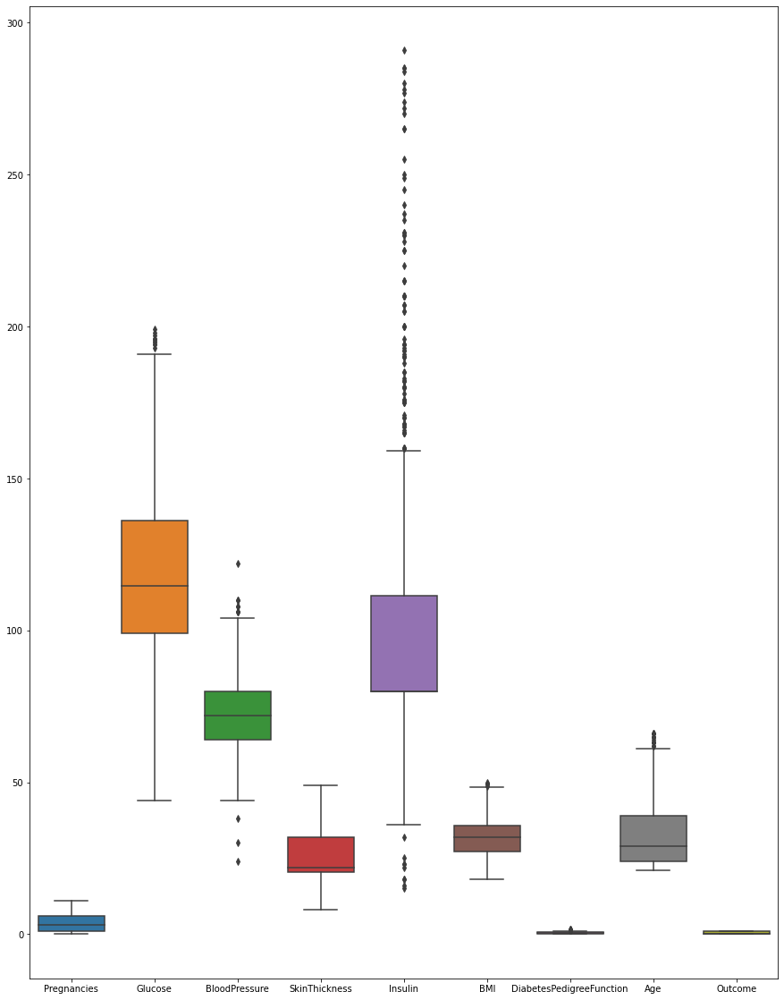

In [58]:
fig, ax = plt.subplots(figsize=(15,20))
sns.boxplot(data=df_new)

<AxesSubplot:>

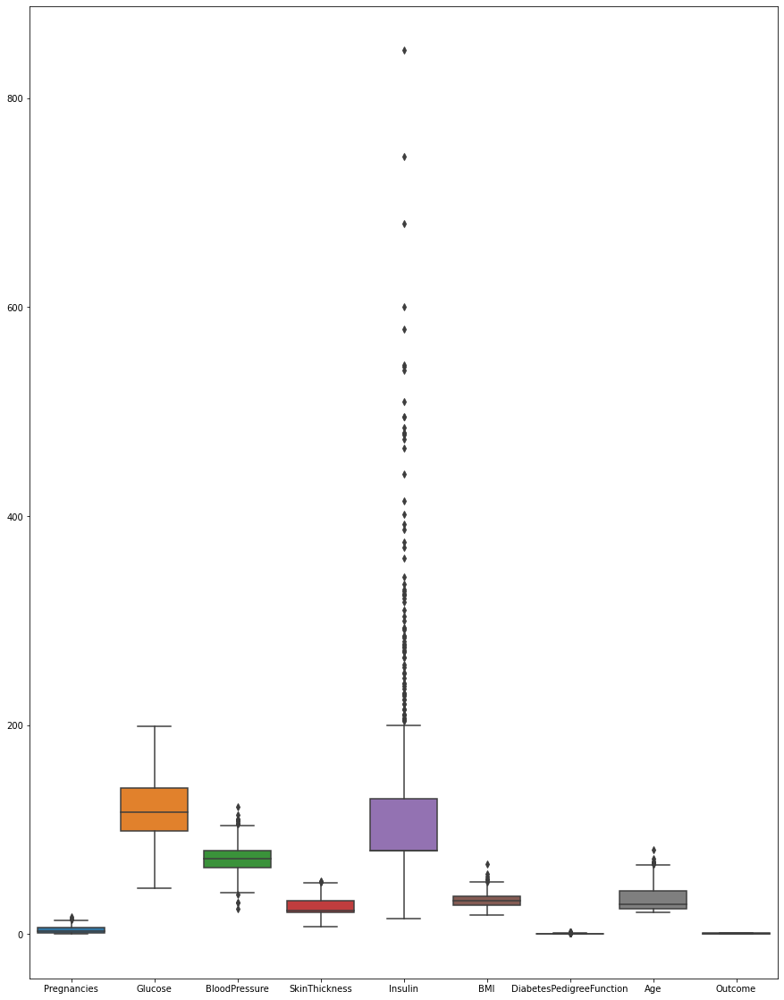

In [53]:
fig, ax = plt.subplots(figsize=(15,20))
sns.boxplot(data=df_new)

In [ ]:
fig, ax = plt.subplots(figsize=(15,20))
sns.boxplot(data=df_new)

In [59]:
ProfileReport(df_new)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [60]:
y = df_new['Outcome']

In [61]:
X = df_new.drop(columns=['Outcome'])

In [62]:
X.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30


### Dataset values have fluctuations, so we use standard scaler

In [67]:
scaler = StandardScaler()
ProfileReport(pd.DataFrame(scaler.fit_transform(X)))
X_scaled = scaler.fit_transform(X)

<AxesSubplot:>

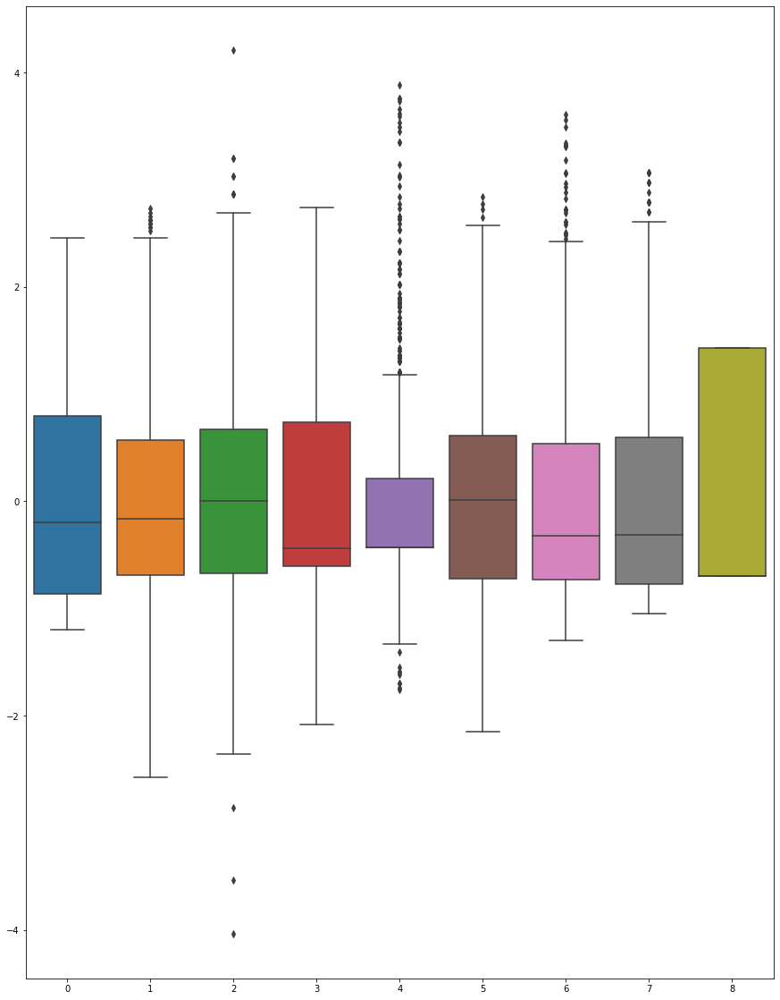

In [66]:
df_new_scaler = pd.DataFrame(scaler.fit_transform(df_new))
fig, ax = plt.subplots(figsize=(15,20))
sns.boxplot(data=df_new_scaler)

In [68]:
X_scaled

array([[ 7.96753910e-01,  9.83984062e-01,  4.52611463e-04, ...,
         2.65819648e-01,  6.30484542e-01,  1.60141519e+00],
       [-8.64793539e-01, -1.16977621e+00, -5.04474494e-01, ...,
        -8.31445036e-01, -3.38078670e-01, -1.32706484e-01],
       [ 1.46137289e+00,  2.18051755e+00, -6.72783529e-01, ...,
        -1.34872696e+00,  7.88402456e-01, -4.14369227e-02],
       ...,
       [ 4.64444420e-01,  6.09439465e-02,  4.52611463e-04, ...,
        -8.94145875e-01, -7.10063091e-01, -2.23976046e-01],
       [-8.64793539e-01,  2.31877301e-01, -1.00940160e+00, ...,
        -2.82812694e-01, -3.45097244e-01,  1.32760650e+00],
       [-8.64793539e-01, -8.96282840e-01, -1.67856424e-01, ...,
        -2.35787064e-01, -4.64413001e-01, -8.62862978e-01]])

In [69]:
y

0      1
1      0
2      1
3      0
5      0
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 674, dtype: int64

### Checking the Multicolinearity

In [75]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_df=pd.DataFrame()

In [76]:
X_scaled.shape[1]

8

In [77]:
vif_df['vif']=[variance_inflation_factor(X_scaled,i) for i in range(X_scaled.shape[1])]

In [79]:
vif_df['features'] = X.columns

In [80]:
vif_df

,vif,features
0,1.449056,Pregnancies
1,1.304263,Glucose
2,1.262686,BloodPressure
3,1.470049,SkinThickness
4,1.271017,Insulin
5,1.513160,BMI
6,1.042300,DiabetesPedigreeFunction
7,1.662728,Age


No mulicolinearity observed. So, we will not remove any of the column

#### Train Test Split

In [81]:
X_train,X_test,y_train,y_test = train_test_split(X_scaled,y,test_size=0.2, random_state=144)

In [82]:
X_train

array([[-0.86479354,  0.19769063, -1.85094678, ...,  0.21879402,
         1.80609569, -0.40651517],
       [ 2.45830136,  1.22329076,  0.33707068, ...,  0.21879402,
         3.1782269 ,  1.69268475],
       [ 0.13213493,  0.91561072,  1.09446134, ..., -0.47091521,
        -0.90658316, -0.49778473],
       ...,
       [-0.86479354, -0.28092276,  1.17861586, ..., -0.28281269,
        -1.06801036, -0.86286298],
       [ 1.46137289,  0.02675728,  0.50537972, ..., -1.08224839,
        -0.13454002,  2.87918905],
       [-0.86479354, -0.75953616, -0.33616546, ..., -0.73739378,
         2.27283086, -0.95413254]])

In [83]:
X_test

array([[ 1.32134931e-01, -1.44176079e-01,  4.52611463e-04, ...,
        -4.70915211e-01, -2.50346495e-01,  1.23633694e+00],
       [-1.19710303e+00,  6.76304024e-01, -8.41092564e-01, ...,
        -1.53682948e+00, -8.43415997e-01, -1.04540210e+00],
       [ 2.45830136e+00,  8.13050708e-01,  1.85185200e+00, ...,
         7.36075942e-01, -6.78479508e-01,  1.69268475e+00],
       ...,
       [ 7.96753910e-01, -5.54416131e-01, -5.04474494e-01, ...,
        -1.19197486e+00, -6.96025943e-01, -3.15245608e-01],
       [-5.32484049e-01, -1.20396288e+00, -2.43135269e-01, ...,
         1.38528976e-02, -5.03015158e-01, -1.04540210e+00],
       [-8.64793539e-01, -1.64838960e+00, -2.01925581e+00, ...,
        -1.80330804e+00, -4.36338705e-01, -9.54132539e-01]])

### Building a model

In [84]:
logr = LogisticRegression(verbose=1)

In [85]:
logr.fit(X_train,y_train) 

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    8.1s finished


LogisticRegression(verbose=1)

In [98]:
logr_liblinear = LogisticRegression(verbose=1, solver='liblinear')

In [100]:
logr_liblinear.fit(X_train,y_train)

[LibLinear]

LogisticRegression(solver='liblinear', verbose=1)

#### Prdicting the data

In [87]:
X_train[0]

array([-0.86479354,  0.19769063, -1.85094678,  1.67965825,  1.34653496,
        0.21879402,  1.80609569, -0.40651517])

In [88]:
logr.predict([X_test[0]])

array([0], dtype=int64)

It belogs to class 0

In [ ]:
logr.predict([X_test[1]])

array([0], dtype=int64)

In [90]:
logr.predict_proba([X_test[0]])       ### Showing the prediction probability

array([[0.83549024, 0.16450976]])

In [94]:
logr.predict_proba([X_test[1]]) 

array([[0.91629065, 0.08370935]])

In [91]:
logr.predict_log_proba([X_test[0]])   ### Showing the negative or positive classification

array([[-0.17973662, -1.80478536]])

In [92]:
y_test.iloc[0]             ### Actual class is 1

1

In [101]:
logr_liblinear.predict([X_test[0]])

array([0], dtype=int64)

#### Accuracy evaluation

In [104]:
y_pred_default=logr.predict(X_test)
y_pred_default

array([0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0], dtype=int64)

In [102]:
y_pred_liblinear=logr_liblinear.predict(X_test)
y_pred_liblinear

array([0, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0], dtype=int64)

In [103]:
confusion_matrix(y_test,y_pred_liblinear)

array([[77, 10],
       [24, 24]], dtype=int64)

In [105]:
confusion_matrix(y_test, y_pred_default)

array([[77, 10],
       [24, 24]], dtype=int64)

### Checking the accuracy of the model

In [ ]:
accuracy = (tp+tn)/(tp+tn+fn+fp)

In [106]:
roc_auc_score(y_test,y_pred_liblinear)

0.692528735632184

In [107]:
roc_auc_score(y_test,y_pred_default)

0.692528735632184

In [108]:
roc_curve(y_test,y_pred_default)

(array([0.        , 0.11494253, 1.        ]),
 array([0. , 0.5, 1. ]),
 array([2, 1, 0], dtype=int64))